# Install Packages

In [1]:
!pip install sentence_transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.7/224.7 kB 1.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [2]:
!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 3.7 MB/s eta 0:00:00


In [3]:
!pip install WordCloud

In [4]:
!pip install fasttext

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.8/68.8 kB 819.1 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached pybind11-2.12.0-py3-none-any.whl (234 kB)
  Created wheel for fasttext: filename=fasttext-0.9.2-cp310-cp310-linux_x86_64.whl size=4227142 sha256=0c9aaa55ecdf6c19d6249480483f4138d5f18b59b15affb1ace06d41b1a8f58f
  Stored in directory: /root/.cache/pip/wheels/a5/13/75/f811c84a8ab36eedbaef977a6a58a98990e8e0f1967f98f394
Successfully built fasttext


In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import os
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import string
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist, squareform
import seaborn as sns
from scipy.sparse import csr_matrix
from transformers import pipeline
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.preprocessing import MinMaxScaler
from gensim.models import Word2Vec
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS
import tensorflow as tf
from transformers import TFBertModel, BertTokenizer
import gensim
from gensim.models.doc2vec import TaggedDocument, Doc2Vec
from collections import Counter
from transformers import RobertaModel, RobertaTokenizer
import torch
from sklearn.manifold import TSNE
import tensorflow_hub as hub
from wordcloud import WordCloud
import umap.umap_ as umap
from sklearn.preprocessing import normalize
from sentence_transformers import SentenceTransformer
from gensim.models import FastText
from collections import defaultdict
import matplotlib.colors as mcolors
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
import torch
from transformers import pipeline

# Load *Data*

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
path = '/content/drive/MyDrive/extracted_files/final_merged.csv'
new_df = pd.read_csv(path)
data = new_df.copy()
data = data.dropna()

# Data Exploration

Average Length of Abstracts (words): 207.61
Average Length of Abstracts (characters): 1427.14


<ipython-input-9-1a4537bbbf0c>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_journals.values, y=top_journals.index, palette='viridis')


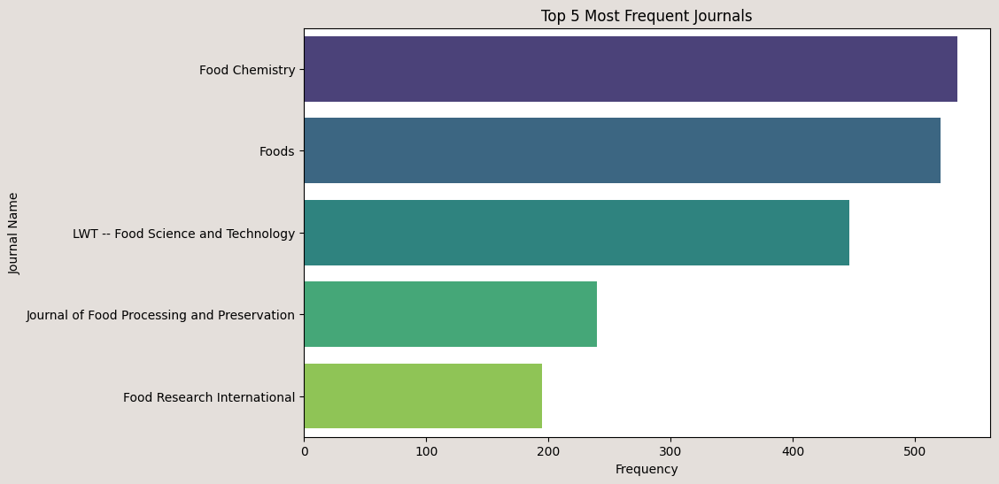

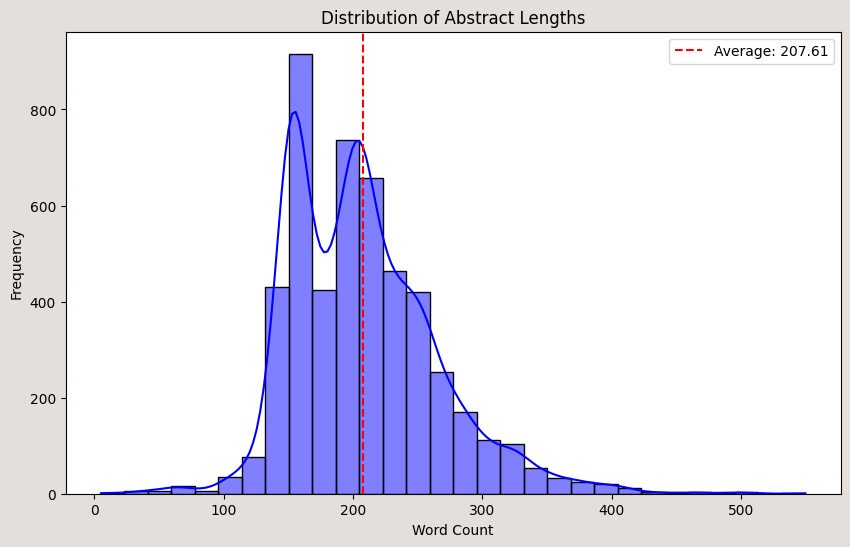

In [9]:
# Load your data
df = data.copy()

# Calculate the average length of abstracts (word count)
df['Abstract_Length'] = df['AB'].apply(lambda x: len(x.split()))
average_length_words = df['Abstract_Length'].mean()

# Calculate the average length of abstracts (character count)
df['Abstract_Length_Chars'] = df['AB'].apply(len)
average_length_chars = df['Abstract_Length_Chars'].mean()

# Find the top 5 most frequent journals
top_journals = df['SO'].value_counts().head(5)

# Find the top 5 most frequent authors
top_authors = df['AU'].value_counts().head(5)

# Display the average lengths
print(f"Average Length of Abstracts (words): {average_length_words:.2f}")
print(f"Average Length of Abstracts (characters): {average_length_chars:.2f}")

# Plotting the top 5 most frequent journals
plt.figure(figsize=(10, 6), facecolor="#E4DFDB")
sns.barplot(x=top_journals.values, y=top_journals.index, palette='viridis')
plt.xlabel('Frequency')
plt.ylabel('Journal Name')
plt.title('Top 5 Most Frequent Journals')
plt.show()

# Plotting the histogram for word count
plt.figure(figsize=(10, 6), facecolor="#E4DFDB")
sns.histplot(df['Abstract_Length'], bins=30, kde=True, color='blue')
plt.xlabel('Word Count')
plt.ylabel('Frequency')
plt.title('Distribution of Abstract Lengths')
plt.axvline(average_length_words, color='red', linestyle='--', label=f'Average: {average_length_words:.2f}')
plt.legend()
plt.show()

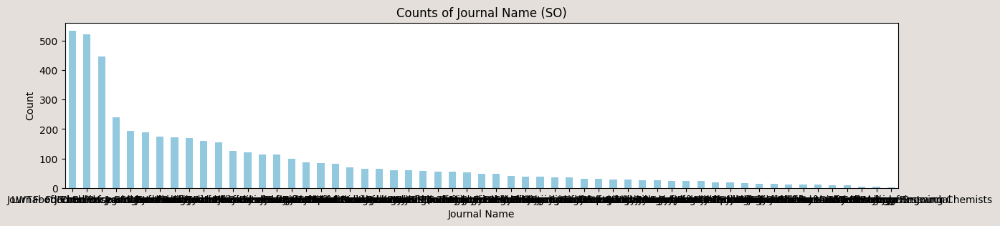

In [17]:
# Compute the counts of unique values in 'SO'
counts = data['SO'].value_counts().reset_index()
counts.columns = ['Journal Name', 'Count']

# Plotting
plt.figure(figsize=(15, 3), facecolor='#E4DFDB')
sns.barplot(x='Journal Name', y='Count', data=counts, color='skyblue', width=0.5)
plt.title('Counts of Journal Name (SO)')
plt.xlabel('Journal Name')
plt.ylabel('Count')

plt.show()

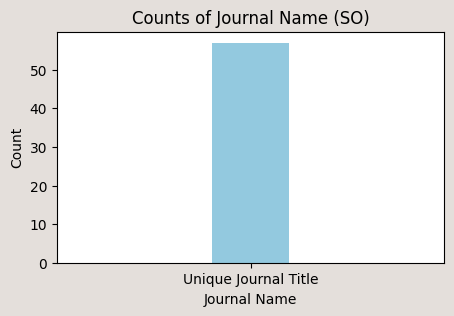

In [22]:
# Compute the counts of unique values in 'SO'
dic = {"SO": ['Unique Journal Title'], 'Count': [len(set(data.SO))]}  # Example data
df = pd.DataFrame(dic)

# Plotting
plt.figure(figsize=(5, 3), facecolor='#E4DFDB')
sns.barplot(x='SO', y='Count', data=df, color='skyblue', width=0.2)
plt.title('Counts of Journal Name (SO)')
plt.xlabel('Journal Name')
plt.ylabel('Count')

plt.show()

# Text Processing

In [23]:
def remove_last_sentence(paragraph):
    sentences = paragraph.split('. ')
    if len(sentences) > 1:
        return '. '.join(sentences[:-1]) + '.'  # Join all sentences except the last one and add a period at the end
    else:
        return paragraph

# Apply the function to the 'AB' column
data['AB'] = data['AB'].apply(remove_last_sentence)

In [24]:
print(data.isna().sum())

# Function to normalize journal titles
def normalize_journal_title(title):
    if not isinstance(title, str):
        return ""
    title = title.lower()
    title = re.sub(r'[^a-zA-Z\s]', '', title)
    title = re.sub(r'\s+', ' ', title).strip()
    title = title.replace('and', '&')
    return title

# Apply normalization to the journal titles
data['SO'] = data['SO'].apply(normalize_journal_title)

# Check for unique journal titles after normalization
unique_titles = data['SO'].unique()
print(f"Number of unique journal titles: {len(unique_titles)}")

# Initialize the Sentence-BERT model
model = SentenceTransformer('paraphrase-MiniLM-L6-v2')

# Create sentence embeddings for the journal titles
embeddings = model.encode(unique_titles)

# Check the shape of the sentence embeddings
print(f"Shape of the sentence embeddings: {embeddings.shape}")

# Compute cosine similarity matrix
cosine_sim_matrix = cosine_similarity(embeddings)

# Print the cosine similarity matrix
print("Cosine similarity matrix:")
print(cosine_sim_matrix)

AB    0
SO    0
TI    0
AU    0
dtype: int64
Number of unique journal titles: 57


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.73k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/314 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Shape of the sentence embeddings: (57, 384)
Cosine similarity matrix:
[[1.0000001  0.47078288 0.71350145 ... 0.5803156  0.6006862  0.16410698]
 [0.47078288 0.9999998  0.47780806 ... 0.3608177  0.40162805 0.23274717]
 [0.71350145 0.47780806 1.0000002  ... 0.6535888  0.6686306  0.10021723]
 ...
 [0.5803156  0.3608177  0.6535888  ... 1.0000001  0.82601535 0.03318781]
 [0.6006862  0.40162805 0.6686306  ... 0.82601535 1.         0.10363856]
 [0.16410698 0.23274717 0.10021723 ... 0.03318781 0.10363856 0.9999999 ]]


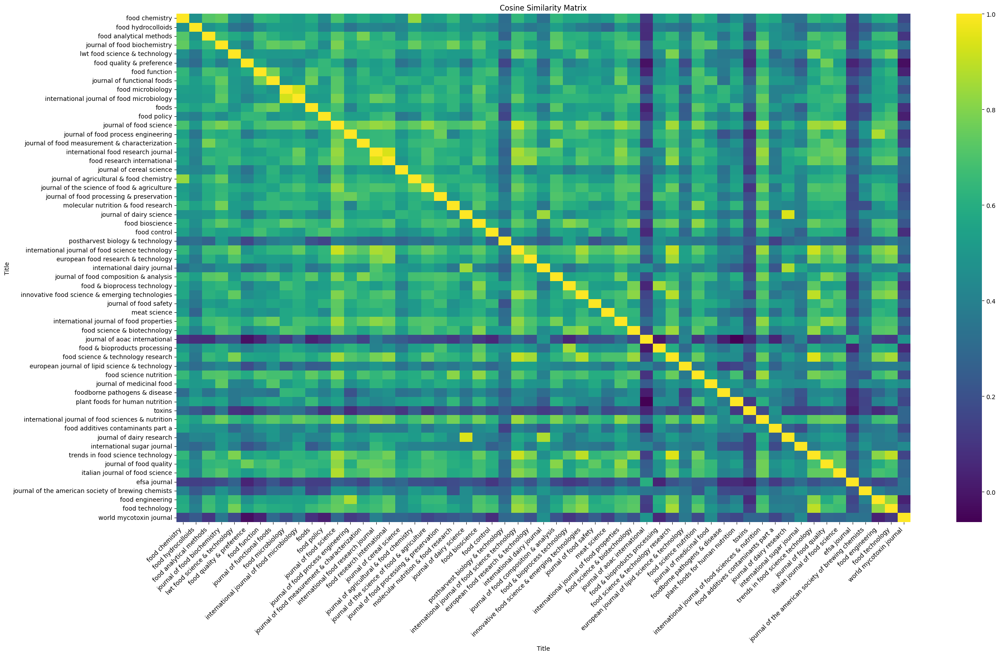

In [25]:
# Plotting the cosine similarity matrix using heatmap
plt.figure(figsize=(25, 15))
sns.heatmap(cosine_sim_matrix, cmap='viridis', annot=False, fmt=".2f")

# Set x-axis tick labels to unique titles
plt.xticks(np.arange(len(unique_titles)) + 0.5, unique_titles, rotation=45, ha='right')

# Set y-axis tick labels to unique titles
plt.yticks(np.arange(len(unique_titles)) + 0.5, unique_titles, rotation=0)

# plt.colorbar(label='Cosine Similarity')
plt.title('Cosine Similarity Matrix')
plt.xlabel('Title')
plt.ylabel('Title')
plt.tight_layout()
plt.show()

In [26]:
# Find similar titles based on cosine similarity matrix
similar_titles = {}

for i, title in enumerate(unique_titles):
    # max_sim = np.max(cosine_sim_matrix[i])
    similar_indices = np.where(cosine_sim_matrix[i] >= 0.90)[0]
    if len(similar_indices) > 1:
      similar_titles[title] = [unique_titles[j] for j in similar_indices if j != i]

print("Similar Titles:")
for title, sim_titles in similar_titles.items():
    if sim_titles:
        print(f"{title}: {sim_titles}")

Similar Titles:
food microbiology: ['international journal of food microbiology']
international journal of food microbiology: ['food microbiology']
journal of food science: ['international journal of food science technology']
international food research journal: ['food research international']
food research international: ['international food research journal']
journal of dairy science: ['journal of dairy research']
international journal of food science technology: ['journal of food science', 'food science & technology research', 'trends in food science technology']
food science & technology research: ['international journal of food science technology', 'trends in food science technology']
journal of dairy research: ['journal of dairy science']
trends in food science technology: ['international journal of food science technology', 'food science & technology research']


In [27]:
title_to_index = {title: i+1 for i, title in enumerate(unique_titles)}

# Create a dictionary to map each title to its similar titles' indices
similar_titles_index = {}
for title, sim_titles in similar_titles.items():
    title_index = title_to_index[title]
    for sim_title in sim_titles:
      title_to_index[sim_title] = title_index

In [28]:
title_to_index

{'food chemistry': 1,
 'food hydrocolloids': 2,
 'food analytical methods': 3,
 'journal of food biochemistry': 4,
 'lwt food science & technology': 5,
 'food quality & preference': 6,
 'food function': 7,
 'journal of functional foods': 8,
 'food microbiology': 9,
 'international journal of food microbiology': 9,
 'foods': 11,
 'food policy': 12,
 'journal of food science': 13,
 'journal of food process engineering': 14,
 'journal of food measurement & characterization': 15,
 'international food research journal': 16,
 'food research international': 16,
 'journal of cereal science': 18,
 'journal of agricultural & food chemistry': 19,
 'journal of the science of food & agriculture': 20,
 'journal of food processing & preservation': 21,
 'molecular nutrition & food research': 22,
 'journal of dairy science': 23,
 'food bioscience': 24,
 'food control': 25,
 'postharvest biology & technology': 26,
 'international journal of food science technology': 13,
 'european food research & techno

In [29]:
len(set(title_to_index.values()))

51

In [ ]:
data["SO"] = data["SO"].map(lambda x: title_to_index.get(x.lower(), 0))

In [30]:
# Download necessary NLTK data
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Data Preprocessing
def preprocess_text(text):
    # Convert to lowercase
    text = text.lower()

    # Remove specific phrases
    text = re.sub(r'\bin this study\b', '', text, flags=re.IGNORECASE)
    text = re.sub(r'\bstudy\b', '', text, flags=re.IGNORECASE)
    text = re.sub(r'all rights reserved, elsevier\.', '', text, flags=re.IGNORECASE)

    # Remove special characters and digits
    # text = re.sub(r'\d+', '', text)
    allowed_characters = '<>=%$-/≤≥+*'
    text = re.sub(rf'[^\w\s{re.escape(allowed_characters)}]', '', text)
    # text = re.sub(r'\W+', ' ', text)
    # Tokenize
    tokens = word_tokenize(text)

    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in tokens if word not in stop_words]

    # Lemmatize
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in filtered_tokens]

    # Remove stopwords
    return ' '.join(lemmatized_tokens)

# Apply preprocessing to the abstracts
data['cleaned_AB'] = data['AB'].apply(preprocess_text)
documents = data.cleaned_AB.tolist()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


# Embeddings
1. TFIDF
2. Word2Vec
3. Doc2Vec
4. FastText
5. Sentence Transformer

In [31]:
# Vectorization using TF-IDF
# tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 3),max_features=500)
# tfidf_matrix = tfidf_vectorizer.fit_transform(data['cleaned_AB'])
# document_embeddings_np = tfidf_matrix.toarray()

# Word2Vec
def get_document_embedding(doc, model):
    valid_words = [word for word in doc if word in model.wv.key_to_index]
    if not valid_words:
        return np.zeros(model.vector_size)
    return np.mean([model.wv[word] for word in valid_words], axis=0)

tokenized_texts = [word_tokenize(text) for text in documents]
word2vec_model = Word2Vec(sentences=tokenized_texts, vector_size=128, window=2, min_count=2, workers=4, sg=1)
document_embeddings_np = np.array([get_document_embedding(doc, word2vec_model) for doc in tokenized_texts])

# Doc2Vec
# tokenized_paragraphs = [word_tokenize(paragraph) for paragraph in documents]
# tagged_documents = [TaggedDocument(words=paragraph, tags=[str(i)]) for i, paragraph in enumerate(tokenized_paragraphs)]
# model = Doc2Vec(tagged_documents, vector_size=128, window=3, min_count=2, workers=4, epochs=10)
# document_embeddings = [model.docvecs[str(i)] for i in range(len(tokenized_paragraphs))]
# document_embeddings_np = np.array(document_embeddings)

# FastText
# def get_paragraph_embedding(paragraph, model):
#     embeddings = [model.wv[word] for word in paragraph if word in model.wv]
#     if embeddings:
#         return np.mean(embeddings, axis=0)
#     else:
#         return np.zeros(model.vector_size)  # Zero vector if no words in vocab

# tokenized_texts = [word_tokenize(paragraph) for paragraph in documents]
# fasttext_model = FastText(sentences=tokenized_texts, vector_size=128, window=3, min_count=2, workers=4, epochs=10)
# paragraph_embeddings = [get_paragraph_embedding(paragraph, fasttext_model) for paragraph in tokenized_texts]
# document_embeddings_np = np.array(paragraph_embeddings)

# SentenceTransformer
# model_name = 'paraphrase-MiniLM-L6-v2'
# model = SentenceTransformer(model_name)
# document_embeddings_np = model.encode(documents)

# Dimensionality Reduction

In [32]:
embeddings = document_embeddings_np.copy()

# PCA
# pca = PCA(n_components=2)
# pca_result = pca.fit_transform(embeddings)

# UMAP
reducer = umap.UMAP(n_neighbors=20,min_dist=0.2)
pca_result = reducer.fit_transform(embeddings)


In [33]:
embeddings.shape

(4993, 128)

### Store Features Value

In [34]:
data['pca_1'], data['pca_2'] = pca_result[:, 0], pca_result[:, 1]

# Clustering

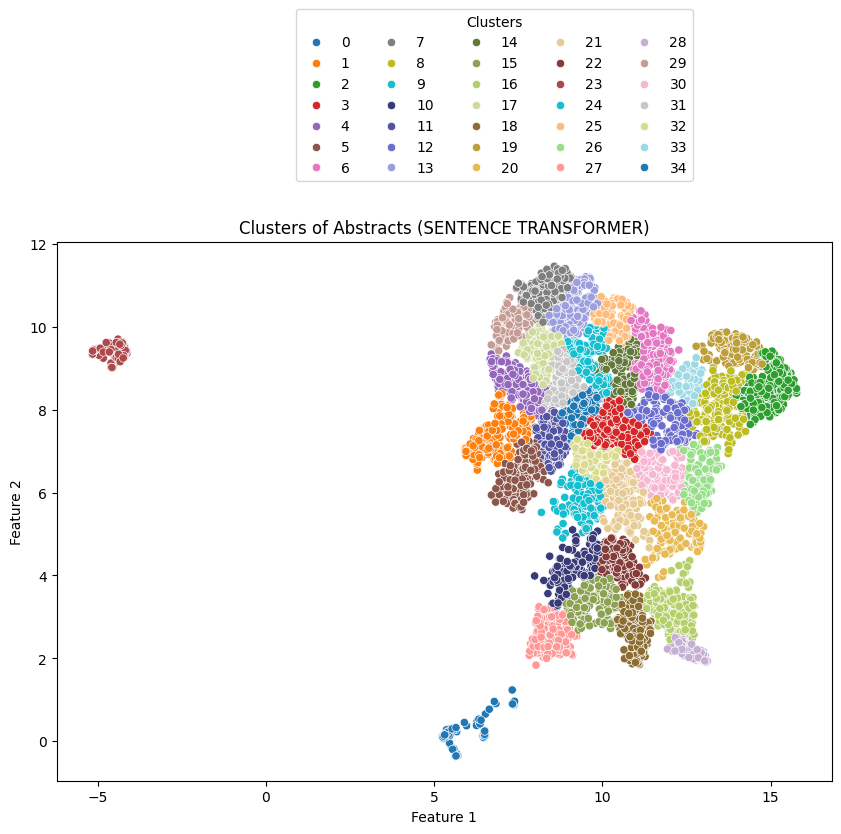

In [36]:
# Clustering using K-Means
# kmeans = KMeans(n_clusters=30, random_state=42)
# data['cluster'] = kmeans.fit_predict(pca_result)

# Apply HDBSCAN clustering
# clusterer = hdbscan.HDBSCAN(min_cluster_size=5)
# data['cluster'] = clusterer.fit_predict(pca_result)

# n_samples = embeddings.shape[0]  # Get the total number of samples
# bandwidth = estimate_bandwidth(pca_result, quantile=0.1, n_samples=n_samples)
# # Perform Mean Shift clustering
# ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
# ms.fit(embeddings)
# # Get cluster centers and number of clusters
# cluster_centers = ms.cluster_centers_
# data['cluster'] = ms.labels_

# OPTICS
# optics_model = OPTICS(min_samples=50, xi=0.05, min_cluster_size=0.05)
# # Fit the model to your data
# optics_model.fit(embeddings)
# data.cluster = optics_model.labels_

#SPECTRAL
# spectral_clustering = SpectralClustering(n_clusters=30, affinity='nearest_neighbors', random_state=42)
# spectral_clustering.fit(pca_result)
# data.cluster = spectral_clustering.labels_

# cosine_sim_matrix = cosine_similarity(pca_result)
# threshold = 0.4  # Example threshold value
# cosine_sim_matrix[cosine_sim_matrix < threshold] = 0
# cosine_sim_matrix = normalize(cosine_sim_matrix, norm='l2')
# preference = -np.median(cosine_sim_matrix)


# AFFINITY
# affinity_propagation = AffinityPropagation(damping=0.9, preference=preference, affinity='precomputed', verbose=False)
# affinity_propagation.fit(cosine_sim_matrix)
# data.cluster = affinity_propagation.labels_

# AGGLOMORATIVE
agg_clustering = AgglomerativeClustering(linkage='ward', distance_threshold=9.5, n_clusters=None)
# Fit the model to the data
agg_clustering.fit(pca_result)
data['cluster'] = agg_clustering.labels_

colors = [
    "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd",
    "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf",
    "#393b79", "#5254a3", "#6b6ecf", "#9c9ede", "#637939",
    "#8ca252", "#b5cf6b", "#cedb9c", "#8c6d31", "#bd9e39",
    "#e7ba52", "#e7cb94", "#843c39", "#ad494a", "#17becf",
    "#ffbb78", "#98df8a", "#ff9896", "#c5b0d5", "#c49c94",
    "#f7b6d2", "#c7c7c7", "#dbdb8d", "#9edae5", "#1f77b4",
    "#aec7e8", "#ff7f0e", "#ffbb78", "#2ca02c", "#98df8a"
]

# colors = list(mcolors.TABLEAU_COLORS.keys())  # or use any predefined color palette
num_clusters = len(set(data.cluster))
palette = sns.color_palette(colors[:num_clusters])
# palette = sns.color_palette(colors, n_colors=len(set(data.cluster)))

# Visualize the clusters
plt.figure(figsize=(10, 7))
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=data.cluster, palette=palette)
# sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=data.cluster, palette='viridis')
plt.title('Clusters of Abstracts (SENTENCE TRANSFORMER)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend(title='Clusters', bbox_to_anchor=(0.3, 1.1), loc='lower left', ncol=5)
plt.show()

# Silhoutte Score

In [39]:
silhouette_avg = silhouette_score(pca_result, data.cluster)
print(f'Silhouette Score: {silhouette_avg}')

Silhouette Score: 0.36398857831954956


# Dendogram

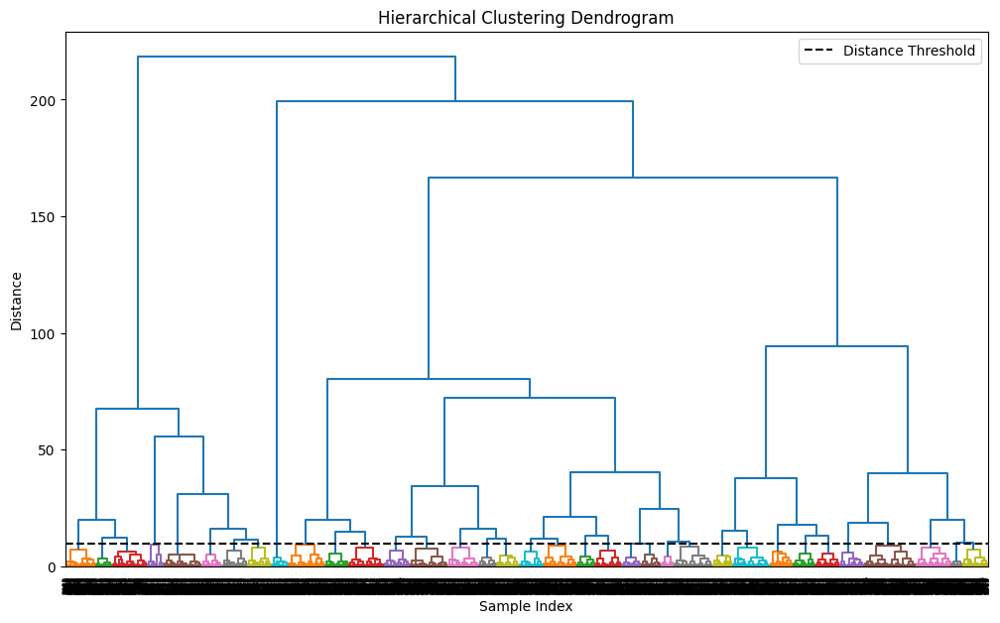

In [41]:
linked = linkage(pca_result, 'ward')

plt.figure(figsize=(12, 7))
dendrogram(linked, color_threshold=9.5)
plt.axhline(y=9.5, c='k', linestyle='--', label='Distance Threshold')
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.legend()
plt.show()

# Text Summarization

### Find closest points

In [42]:
# Get the cluster centers

def find_closest_point(centers):
  # cluster_centers = kmeans.cluster_centers_

  # Create an empty list that will hold your closest points
  closest_indices = []

  # Loop through the number of clusters
  for i in range(len(centers)):

      # Get the list of distances from each point to the centroid of the cluster
      distances = np.linalg.norm(reconstructed_pca_result - centers[i], axis=1)

      # Find the index of the closest point (using argmin to find the smallest distance)
      closest_index = np.argmin(distances)

      # Append that index to your closest indices list
      closest_indices.append(closest_index)

  # Now closest_indices contains the index of the closest point to each centroid
  # You can use these indices to access the corresponding embeddings from your dataset
  # closest_embeddings = reconstructed_pca_result[closest_indices]
  return closest_indices

# T5 Model

In [44]:
summarizer = pipeline(
    "summarization",
    "pszemraj/long-t5-tglobal-base-16384-book-summary"
)

config.json:   0%|          | 0.00/1.05k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/2.36k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.20k [00:00<?, ?B/s]

In [ ]:
unique_clusters = set(data.cluster)
dic_summary = {}
for cluster_num in unique_clusters:
  cluster = data[data.cluster == cluster_num]

  pca_1 = cluster['pca_1'].values
  pca_2 = cluster['pca_2'].values

# Stack pca_1 and pca_2 horizontally
  reconstructed_pca_result = np.column_stack((pca_1, pca_2))
  n_clusters = min(len(cluster),5)
  kmeans = KMeans(n_clusters=n_clusters, random_state=42)
  sub_cluster_labels = kmeans.fit_predict(reconstructed_pca_result)
  data.loc[data.cluster == cluster_num, 'sub_cluster'] = sub_cluster_labels

  closest_indices = find_closest_point(kmeans.cluster_centers_)
  closest_data_points = cluster.iloc[closest_indices]
  input_text = ' '.join(closest_data_points.AB)

  result = summarizer(input_text)[0]['summary_text']
  dic_summary[cluster_num] = result

# Common Keywords

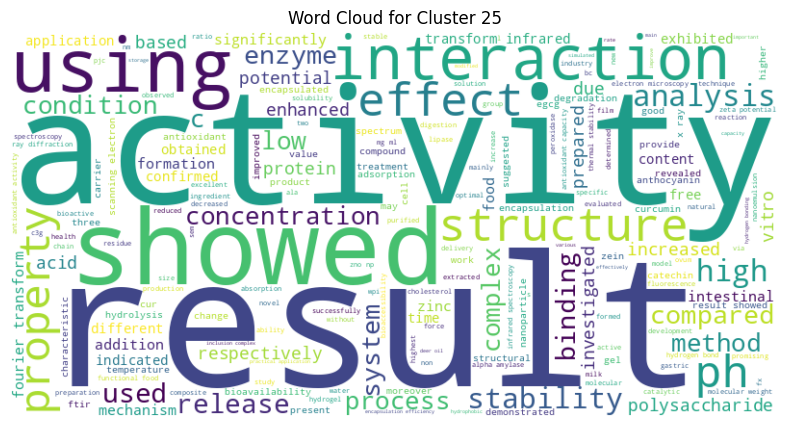

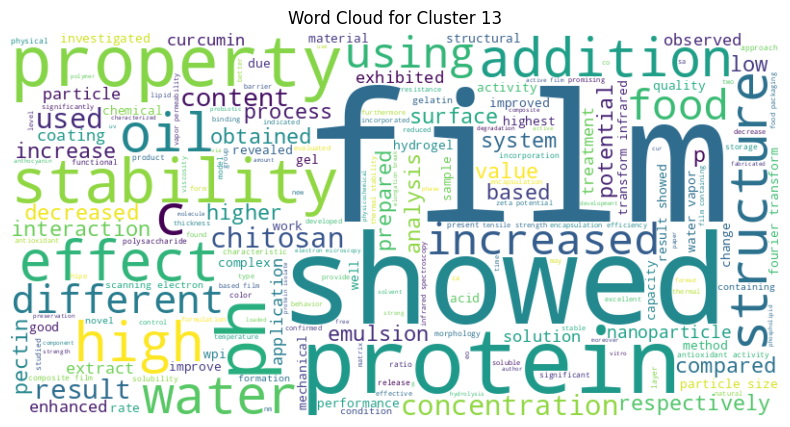

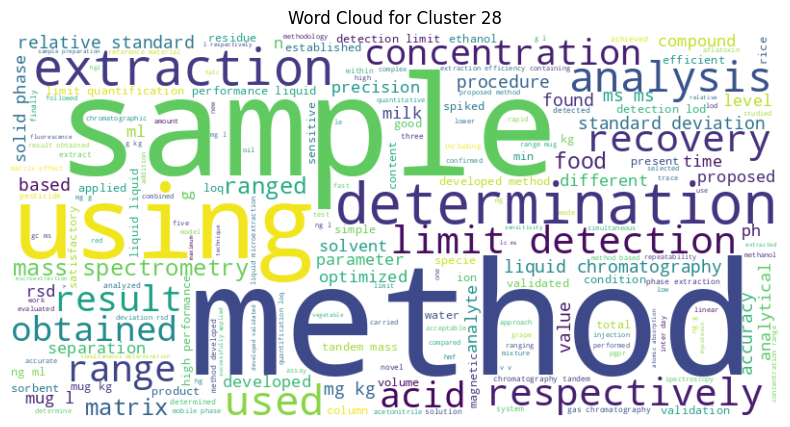

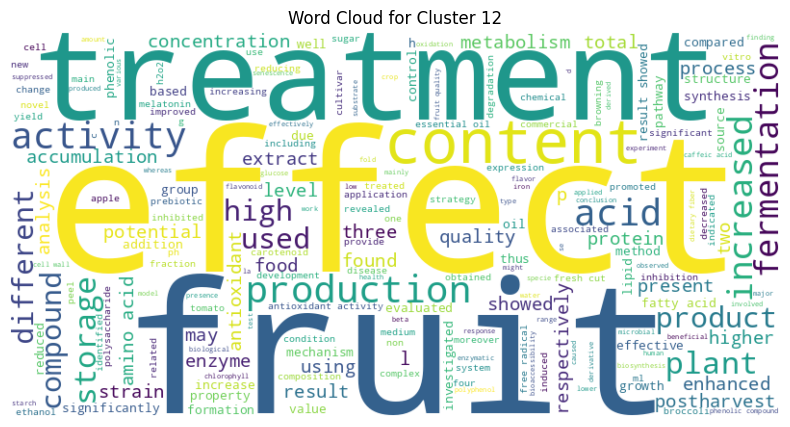

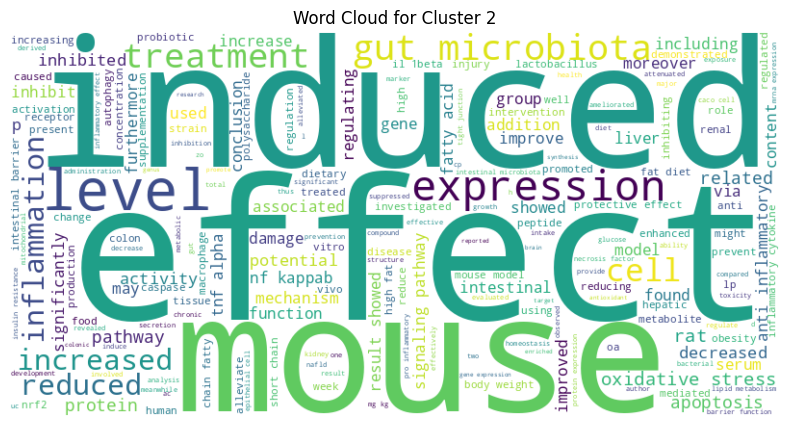

...

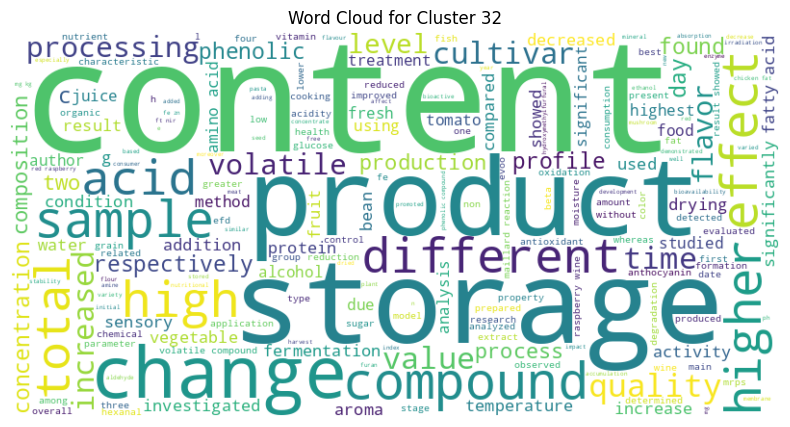

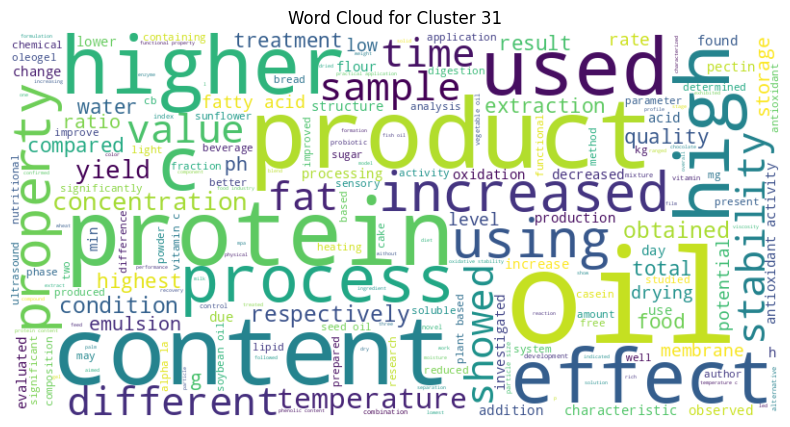

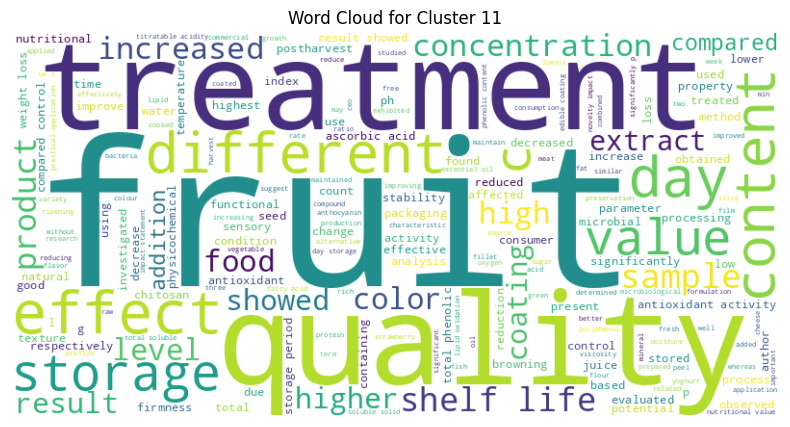

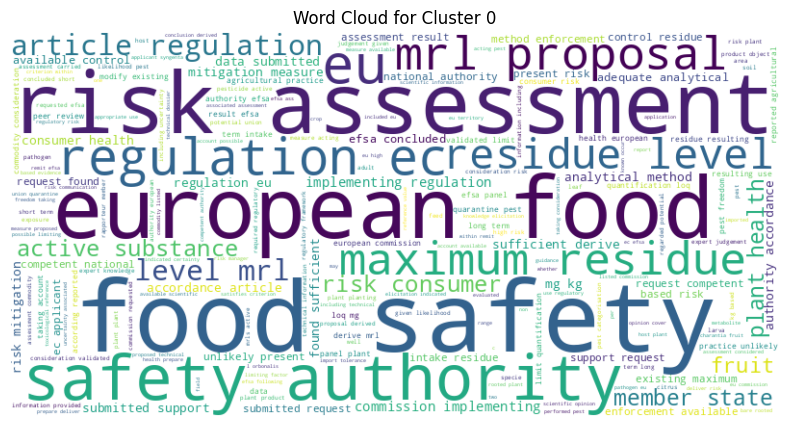

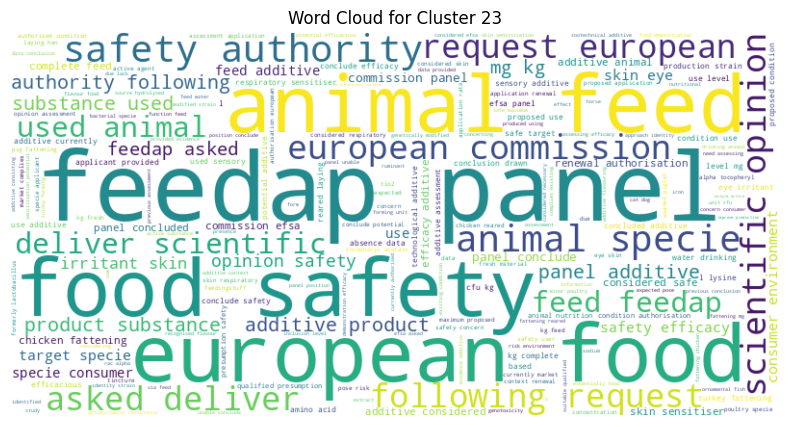

In [45]:
# Create Word Clouds for each Cluster
for cluster_num in data['cluster'].unique():
    cluster_text = ' '.join(data[data['cluster'] == cluster_num]['cleaned_AB'])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cluster_text)

    # Display the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Cluster {cluster_num}')
    plt.show()